In [9]:
import tensorflow_datasets as tfds
from PIL import Image
import numpy as np
from IPython import display
import matplotlib.pyplot as plt

def as_gif(images):
  # Render the images as the gif:
  images[0].save('/tmp/temp.gif', save_all=True, append_images=images[1:], duration=1000, loop=0)
  gif_bytes = open('/tmp/temp.gif','rb').read()
  return gif_bytes

In [10]:
# Points to where the folder with the tfrecords are
BUILDER_DIR = 'TODO'

builder = tfds.builder_from_directory(
    builder_dir=BUILDER_DIR
)

ds = builder.as_dataset(split='train')

ds_iterator = iter(ds)

2024-03-11 22:55:48.384696: W tensorflow/core/kernels/data/cache_dataset_ops.cc:858] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [11]:
episode = next(ds_iterator)
steps = episode['steps']


2024-03-11 22:55:48.598826: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


209 images


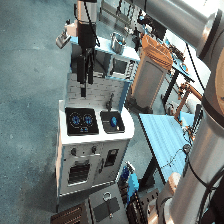

In [12]:
images = []
actions = []

for step in steps:

  im = Image.fromarray(np.array(step['observation']['image']))
  images.append(im)
  actions.append(step['action'])

print(f'{len(images)} images')

display.Image(as_gif(images))


In [13]:
data_2d_array = np.array(actions).T

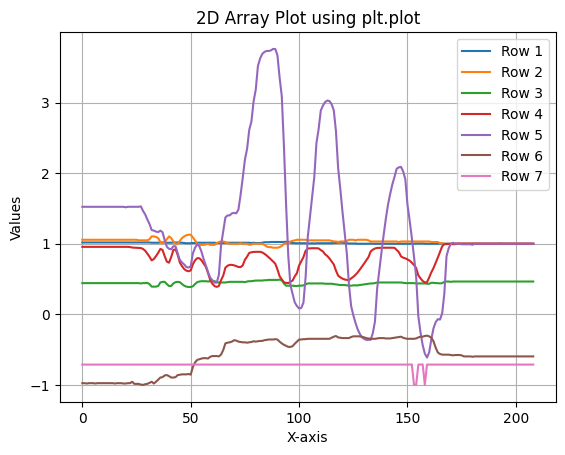

In [14]:
# Get the number of rows (each row will be a separate line plot)
num_rows = data_2d_array.shape[0]

# Plot each row using plt.plot
for i in range(num_rows):
    plt.plot(data_2d_array[i], label=f'Row {i + 1}')

# Add labels and legend
plt.title('2D Array Plot using plt.plot')
plt.xlabel('X-axis')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()
